In [1]:
#Importing libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import sklearn
from sklearn.metrics import accuracy_score 
from sklearn.metrics import confusion_matrix, classification_report 
from sklearn.model_selection import train_test_split
from scipy.stats import zscore #to remove outliers
import requests
import io
import warnings
warnings.filterwarnings('ignore')
from pandas_profiling import ProfileReport
from pandas_profiling import ProfileReport
%matplotlib inline
from sklearn import tree

In [2]:
#Importing dataset

In [3]:
df = pd.read_csv("avocado.csv")

# eda

In [4]:
df.head(5)

,Unnamed: 0,Date,AveragePrice,Total Volume,4046,4225,4770,Total Bags,Small Bags,Large Bags,XLarge Bags,type,year,region
0,0,2015-12-27,1.33,64236.62,1036.74,54454.85,48.16,8696.87,8603.62,93.25,0.0,conventional,2015,Albany
1,1,2015-12-20,1.35,54876.98,674.28,44638.81,58.33,9505.56,9408.07,97.49,0.0,conventional,2015,Albany
2,2,2015-12-13,0.93,118220.22,794.70,109149.67,130.50,8145.35,8042.21,103.14,0.0,conventional,2015,Albany
3,3,2015-12-06,1.08,78992.15,1132.00,71976.41,72.58,5811.16,5677.40,133.76,0.0,conventional,2015,Albany
4,4,2015-11-29,1.28,51039.60,941.48,43838.39,75.78,6183.95,5986.26,197.69,0.0,conventional,2015,Albany


In [5]:
df.tail(5)

,Unnamed: 0,Date,AveragePrice,Total Volume,4046,4225,4770,Total Bags,Small Bags,Large Bags,XLarge Bags,type,year,region
18244,7,2018-02-04,1.63,17074.83,2046.96,1529.20,0.00,13498.67,13066.82,431.85,0.0,organic,2018,WestTexNewMexico
18245,8,2018-01-28,1.71,13888.04,1191.70,3431.50,0.00,9264.84,8940.04,324.80,0.0,organic,2018,WestTexNewMexico
18246,9,2018-01-21,1.87,13766.76,1191.92,2452.79,727.94,9394.11,9351.80,42.31,0.0,organic,2018,WestTexNewMexico
18247,10,2018-01-14,1.93,16205.22,1527.63,2981.04,727.01,10969.54,10919.54,50.00,0.0,organic,2018,WestTexNewMexico
18248,11,2018-01-07,1.62,17489.58,2894.77,2356.13,224.53,12014.15,11988.14,26.01,0.0,organic,2018,WestTexNewMexico


In [6]:
df.drop('Unnamed: 0',axis=1,inplace=True)

Feature "Unnamed:0" is just a representation of the indexes, so removed it

In [7]:
df.head(5)

,Date,AveragePrice,Total Volume,4046,4225,4770,Total Bags,Small Bags,Large Bags,XLarge Bags,type,year,region
0,2015-12-27,1.33,64236.62,1036.74,54454.85,48.16,8696.87,8603.62,93.25,0.0,conventional,2015,Albany
1,2015-12-20,1.35,54876.98,674.28,44638.81,58.33,9505.56,9408.07,97.49,0.0,conventional,2015,Albany
2,2015-12-13,0.93,118220.22,794.70,109149.67,130.50,8145.35,8042.21,103.14,0.0,conventional,2015,Albany
3,2015-12-06,1.08,78992.15,1132.00,71976.41,72.58,5811.16,5677.40,133.76,0.0,conventional,2015,Albany
4,2015-11-29,1.28,51039.60,941.48,43838.39,75.78,6183.95,5986.26,197.69,0.0,conventional,2015,Albany


In [8]:
df.shape # check the data dimension

(18249, 13)

In [9]:
df.dtypes

Date             object
AveragePrice    float64
Total Volume    float64
4046            float64
4225            float64
4770            float64
Total Bags      float64
Small Bags      float64
Large Bags      float64
XLarge Bags     float64
type             object
year              int64
region           object
dtype: object

In [10]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18249 entries, 0 to 18248
Data columns (total 13 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Date          18249 non-null  object 
 1   AveragePrice  18249 non-null  float64
 2   Total Volume  18249 non-null  float64
 3   4046          18249 non-null  float64
 4   4225          18249 non-null  float64
 5   4770          18249 non-null  float64
 6   Total Bags    18249 non-null  float64
 7   Small Bags    18249 non-null  float64
 8   Large Bags    18249 non-null  float64
 9   XLarge Bags   18249 non-null  float64
 10  type          18249 non-null  object 
 11  year          18249 non-null  int64  
 12  region        18249 non-null  object 
dtypes: float64(9), int64(1), object(3)
memory usage: 1.8+ MB


We don't have any missing values.

In [11]:
df['Date']=pd.to_datetime(df['Date'])
df['Month']=df['Date'].apply(lambda x:x.month)
df['Day']=df['Date'].apply(lambda x:x.day)
df.head()

,Date,AveragePrice,Total Volume,4046,4225,4770,Total Bags,Small Bags,Large Bags,XLarge Bags,type,year,region,Month,Day
0,2015-12-27,1.33,64236.62,1036.74,54454.85,48.16,8696.87,8603.62,93.25,0.0,conventional,2015,Albany,12,27
1,2015-12-20,1.35,54876.98,674.28,44638.81,58.33,9505.56,9408.07,97.49,0.0,conventional,2015,Albany,12,20
2,2015-12-13,0.93,118220.22,794.70,109149.67,130.50,8145.35,8042.21,103.14,0.0,conventional,2015,Albany,12,13
3,2015-12-06,1.08,78992.15,1132.00,71976.41,72.58,5811.16,5677.40,133.76,0.0,conventional,2015,Albany,12,6
4,2015-11-29,1.28,51039.60,941.48,43838.39,75.78,6183.95,5986.26,197.69,0.0,conventional,2015,Albany,11,29


In [12]:
df.columns # check the column names for EDA

Index(['Date', 'AveragePrice', 'Total Volume', '4046', '4225', '4770',
       'Total Bags', 'Small Bags', 'Large Bags', 'XLarge Bags', 'type', 'year',
       'region', 'Month', 'Day'],
      dtype='object')

In [13]:
df.describe()

,AveragePrice,Total Volume,4046,4225,4770,Total Bags,Small Bags,Large Bags,XLarge Bags,year,Month,Day
count,18249.000000,1.824900e+04,1.824900e+04,1.824900e+04,1.824900e+04,1.824900e+04,1.824900e+04,1.824900e+04,18249.000000,18249.000000,18249.000000,18249.000000
mean,1.405978,8.506440e+05,2.930084e+05,2.951546e+05,2.283974e+04,2.396392e+05,1.821947e+05,5.433809e+04,3106.426507,2016.147899,6.177215,15.662612
std,0.402677,3.453545e+06,1.264989e+06,1.204120e+06,1.074641e+05,9.862424e+05,7.461785e+05,2.439660e+05,17692.894652,0.939938,3.534130,8.776281
min,0.440000,8.456000e+01,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000,2015.000000,1.000000,1.000000
25%,1.100000,1.083858e+04,8.540700e+02,3.008780e+03,0.000000e+00,5.088640e+03,2.849420e+03,1.274700e+02,0.000000,2015.000000,3.000000,8.000000
50%,1.370000,1.073768e+05,8.645300e+03,2.906102e+04,1.849900e+02,3.974383e+04,2.636282e+04,2.647710e+03,0.000000,2016.000000,6.000000,16.000000
75%,1.660000,4.329623e+05,1.110202e+05,1.502069e+05,6.243420e+03,1.107834e+05,8.333767e+04,2.202925e+04,132.500000,2017.000000,9.000000,23.000000
max,3.250000,6.250565e+07,2.274362e+07,2.047057e+07,2.546439e+06,1.937313e+07,1.338459e+07,5.719097e+06,551693.650000,2018.000000,12.000000,31.000000


In [14]:
from sklearn.preprocessing import LabelEncoder

# creating instance of labelencoder
labelencoder = LabelEncoder()
# Assigning numerical values and storing in same column
df['Date'] = labelencoder.fit_transform(df['Date'])
df['type'] = labelencoder.fit_transform(df['type'])
df['region'] = labelencoder.fit_transform(df['region'])

df

,Date,AveragePrice,Total Volume,4046,4225,4770,Total Bags,Small Bags,Large Bags,XLarge Bags,type,year,region,Month,Day
0,51,1.33,64236.62,1036.74,54454.85,48.16,8696.87,8603.62,93.25,0.0,0,2015,0,12,27
1,50,1.35,54876.98,674.28,44638.81,58.33,9505.56,9408.07,97.49,0.0,0,2015,0,12,20
2,49,0.93,118220.22,794.70,109149.67,130.50,8145.35,8042.21,103.14,0.0,0,2015,0,12,13
3,48,1.08,78992.15,1132.00,71976.41,72.58,5811.16,5677.40,133.76,0.0,0,2015,0,12,6
4,47,1.28,51039.60,941.48,43838.39,75.78,6183.95,5986.26,197.69,0.0,0,2015,0,11,29
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18244,161,1.63,17074.83,2046.96,1529.20,0.00,13498.67,13066.82,431.85,0.0,1,2018,53,2,4
18245,160,1.71,13888.04,1191.70,3431.50,0.00,9264.84,8940.04,324.80,0.0,1,2018,53,1,28
18246,159,1.87,13766.76,1191.92,2452.79,727.94,9394.11,9351.80,42.31,0.0,1,2018,53,1,21
18247,158,1.93,16205.22,1527.63,2981.04,727.01,10969.54,10919.54,50.00,0.0,1,2018,53,1,14


In [15]:
df['region'].nunique() #check the number of unique values in region column post label encoding

54

## handle null values

In [16]:
df.isna().sum() #checked for null values

Date            0
AveragePrice    0
Total Volume    0
4046            0
4225            0
4770            0
Total Bags      0
Small Bags      0
Large Bags      0
XLarge Bags     0
type            0
year            0
region          0
Month           0
Day             0
dtype: int64

In [17]:
#   No Null values present in any columns

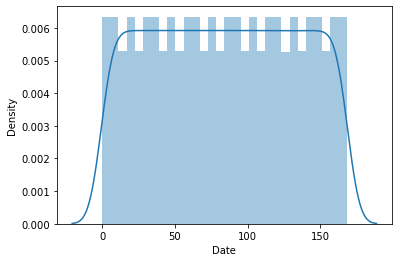

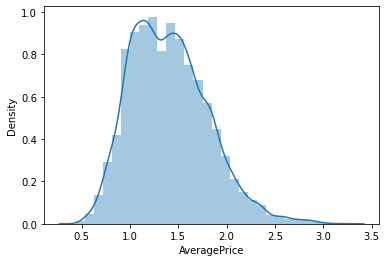

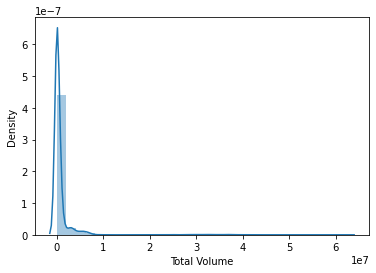

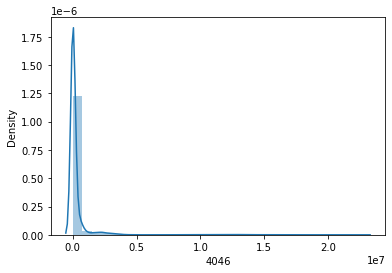

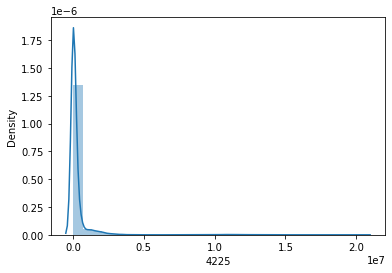

...

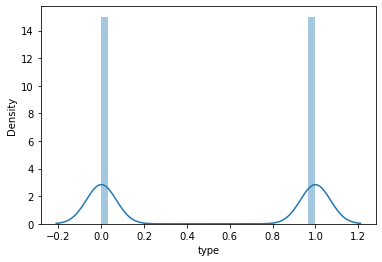

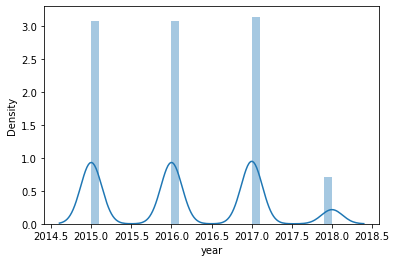

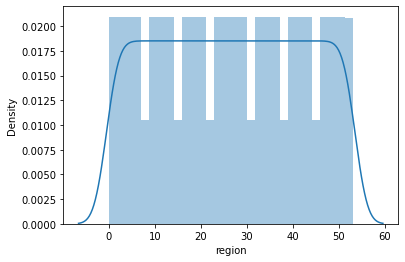

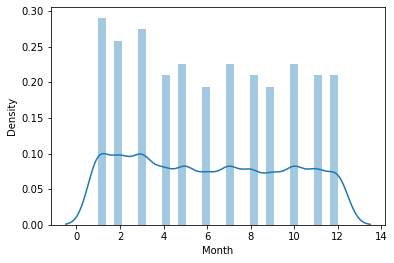

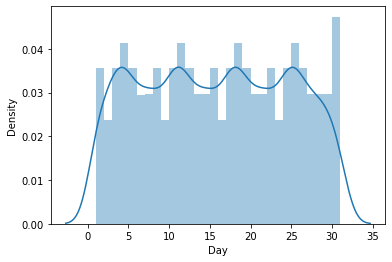

In [18]:
for i in df.columns: 
    sns.distplot(df[i],kde=True,bins=30)
    plt.show()

In [81]:
#data is not normally distributed, hence replacing null values with median
df['region'] = df['region'].fillna(value=df['region'].median())

<AxesSubplot:xlabel='region', ylabel='Density'>

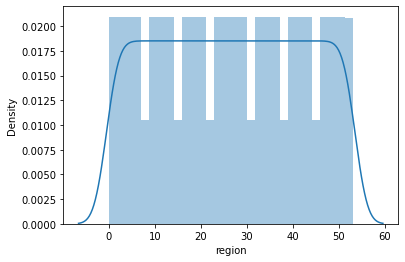

In [19]:
sns.distplot(df['region'],kde=True,bins=30)

In [20]:
#Dropping the columns which are not required
df = df.drop(labels = 'Small Bags', axis = 1)

In [21]:
df = df.drop(labels = 'Large Bags', axis = 1)

In [22]:
df = df.drop(labels = 'XLarge Bags', axis = 1)

In [23]:
df = df.drop(labels = 'type', axis = 1)

In [24]:
df = df.drop(labels = 'year', axis = 1)

In [25]:
df.head()

,Date,AveragePrice,Total Volume,4046,4225,4770,Total Bags,region,Month,Day
0,51,1.33,64236.62,1036.74,54454.85,48.16,8696.87,0,12,27
1,50,1.35,54876.98,674.28,44638.81,58.33,9505.56,0,12,20
2,49,0.93,118220.22,794.70,109149.67,130.50,8145.35,0,12,13
3,48,1.08,78992.15,1132.00,71976.41,72.58,5811.16,0,12,6
4,47,1.28,51039.60,941.48,43838.39,75.78,6183.95,0,11,29


In [26]:
df = df.rename(columns={'region': 'target'})

In [27]:
df.head()

,Date,AveragePrice,Total Volume,4046,4225,4770,Total Bags,target,Month,Day
0,51,1.33,64236.62,1036.74,54454.85,48.16,8696.87,0,12,27
1,50,1.35,54876.98,674.28,44638.81,58.33,9505.56,0,12,20
2,49,0.93,118220.22,794.70,109149.67,130.50,8145.35,0,12,13
3,48,1.08,78992.15,1132.00,71976.41,72.58,5811.16,0,12,6
4,47,1.28,51039.60,941.48,43838.39,75.78,6183.95,0,11,29


In [28]:
profile = ProfileReport(df, title="Pandas Profiling Report")

In [40]:
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

## check for outliers

In [29]:
#remove outliers before skewness check and before x, y split

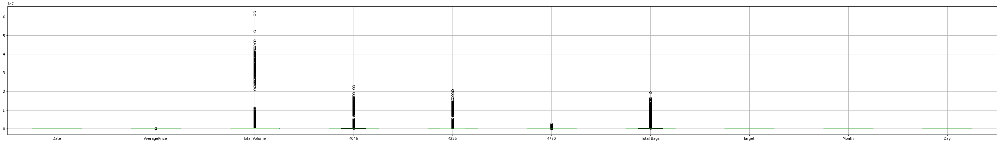

In [30]:
df.boxplot(figsize=[50,8])
plt.subplots_adjust(bottom=0.25)
plt.show()

In [31]:
#Removing outliers by z score

In [32]:
from scipy.stats import zscore
z = np.abs(zscore(df))
new_df = df[(z<3).all(axis=1)]

In [33]:
new_df.shape

(17823, 10)

In [34]:
df.shape

(18249, 10)

In [35]:
dataloss = ((18249-17823)/18249)*100

In [36]:
dataloss

2.3343744862732203

In [37]:
#Outliers are removed since data loss is less than 7%.

In [38]:
df= new_df

## check co-relation

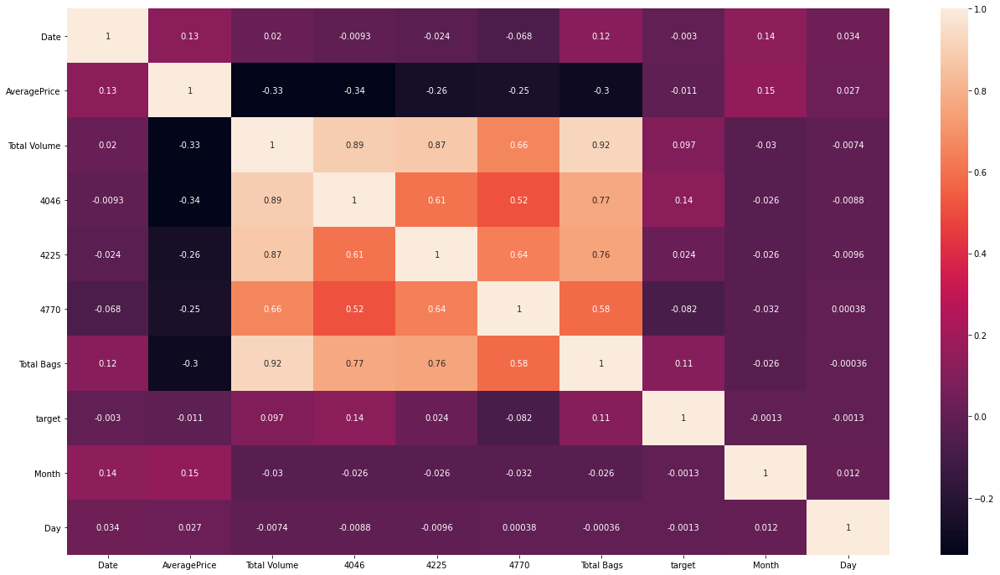

In [39]:
plt.figure(figsize=[22,12])
cor = df.corr()
sns.heatmap(cor, annot = True)
plt.show()

In [40]:
#Arrange co-relation in descending order. Dropping columns should be the last option to prevent data loss.

In [41]:
cor["target"].sort_values(ascending=False)

target          1.000000
4046            0.135525
Total Bags      0.112782
Total Volume    0.097454
4225            0.024286
Day            -0.001258
Month          -0.001279
Date           -0.003002
AveragePrice   -0.011147
4770           -0.081727
Name: target, dtype: float64

In [42]:
df.columns

Index(['Date', 'AveragePrice', 'Total Volume', '4046', '4225', '4770',
       'Total Bags', 'target', 'Month', 'Day'],
      dtype='object')

In [43]:
columns = ['Date', 'AveragePrice', 'Total Volume', '4046', '4225', '4770',
       'Total Bags', 'target', 'Month', 'Day']

In [44]:
#sns.pairplot(df[columns])

## check for skewness

In [45]:
x = df.drop('target',axis=1)
y = df['target']

In [46]:
x.skew() # check skewness

Date            0.005872
AveragePrice    0.384974
Total Volume    3.638205
4046            4.450558
4225            4.128335
4770            4.792655
Total Bags      4.330215
Month           0.111072
Day             0.012347
dtype: float64

In [47]:
from sklearn.preprocessing import power_transform
df_new = power_transform(x, method='yeo-johnson')

df_new = pd.DataFrame(df_new, columns = x.columns)

In [48]:
df_new.skew()

Date           -0.276798
AveragePrice    0.000982
Total Volume   -0.005321
4046           -0.037545
4225           -0.044071
4770            0.021688
Total Bags     -0.017007
Month          -0.145426
Day            -0.208540
dtype: float64

In [49]:
x.skew()

Date            0.005872
AveragePrice    0.384974
Total Volume    3.638205
4046            4.450558
4225            4.128335
4770            4.792655
Total Bags      4.330215
Month           0.111072
Day             0.012347
dtype: float64

## find best random state

In [50]:
#for classification problems

In [51]:
from sklearn.linear_model import LogisticRegression
maxAccu=0
maxRS=0
for i in range(1,200):
    x_train, x_test, y_train, y_test = train_test_split(x,y,test_size=.30, random_state = i)
    LR = LogisticRegression()
    LR.fit(x_train, y_train)
    predLR = LR.predict(x_test)
    acc = accuracy_score(y_test, predLR)
    if acc>maxAccu:
        maxAccu = acc
        maxRS=i
print("Best accuracy is", maxAccu," on Random State ",maxRS)

Best accuracy is 0.11913222367682813  on Random State  78


In [52]:
#We have found the best random state as 78. We will create our train_test_split using this random state.

## test train split

In [53]:
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.3, random_state=6)

## handle data imbalance

<AxesSubplot:xlabel='target', ylabel='count'>

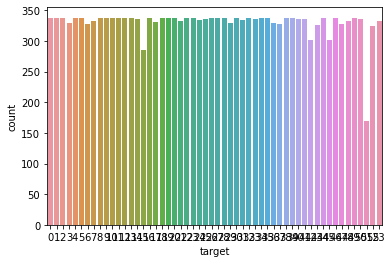

In [54]:
sns.countplot(df['target'])

In [55]:
y.value_counts()

0     338
4     338
26    338
10    338
9     338
8     338
39    338
23    338
16    338
38    338
22    338
12    338
44    338
5     338
11    338
13    338
30    338
34    338
32    338
49    338
18    338
2     338
27    338
35    338
19    338
1     337
28    337
46    337
20    337
33    336
40    336
50    336
25    336
41    336
14    336
24    335
31    335
21    333
48    333
7     332
53    332
17    331
36    330
29    329
3     329
6     328
37    328
47    328
43    326
52    324
42    301
45    301
15    285
51    169
Name: target, dtype: int64

### classification 

In [56]:
#logistic_regression

In [57]:
from sklearn.linear_model import LogisticRegression
LR = LogisticRegression()
LR.fit(x_train, y_train)
predlr = LR.predict(x_test)

print(accuracy_score(y_test,predlr))
print(confusion_matrix(y_test,predlr))
print(classification_report(y_test,predlr))

0.10005610622779129
[[ 0  0  0 ... 50  0  0]
 [ 0  0  2 ... 17 11  0]
 [ 0  0 29 ... 13  0  0]
 ...
 [ 0  0  0 ... 25  9  0]
 [ 0  0  0 ... 24 27  0]
 [ 0  0  2 ... 21  5  2]]
              precision    recall  f1-score   support

           0       0.00      0.00      0.00       113
           1       0.00      0.00      0.00       105
           2       0.40      0.33      0.36        88
           3       0.00      0.00      0.00        84
           4       0.12      0.21      0.16       101
           5       0.00      0.00      0.00       110
           6       0.12      0.22      0.16        89
           7       0.00      0.00      0.00       106
           8       0.82      0.42      0.56        99
           9       0.00      0.00      0.00       110
          10       0.00      0.00      0.00       100
          11       0.00      0.00      0.00       110
          12       0.04      0.03      0.04       102
          13       0.34      0.27      0.30       113
          14 

In [58]:
#support vector machines

In [59]:
from sklearn.svm import SVC
svc = SVC()
svc.fit(x_train,y_train)
predsvc = svc.predict(x_test)

print(accuracy_score(y_test,predsvc))
print(confusion_matrix(y_test,predsvc))
print(classification_report(y_test,predsvc))

0.21488685244062092
[[ 0  0  0 ...  0  0  0]
 [ 0 20  0 ...  0  0  2]
 [ 0  0 38 ...  0  0  0]
 ...
 [ 0  0  0 ... 24  0  0]
 [ 0  0  0 ...  0 26  0]
 [ 0  1  0 ...  0  0 25]]
              precision    recall  f1-score   support

           0       0.00      0.00      0.00       113
           1       0.56      0.19      0.28       105
           2       0.84      0.43      0.57        88
           3       0.03      0.86      0.05        84
           4       0.64      0.34      0.44       101
           5       0.00      0.00      0.00       110
           6       0.62      0.44      0.51        89
           7       0.00      0.00      0.00       106
           8       1.00      0.40      0.58        99
           9       0.22      0.05      0.09       110
          10       0.00      0.00      0.00       100
          11       0.59      0.26      0.36       110
          12       0.40      0.17      0.24       102
          13       0.52      0.14      0.22       113
          14 

In [60]:
#decisiontree

In [61]:
from sklearn.tree import DecisionTreeClassifier
dt = DecisionTreeClassifier()
dt.fit(x_train,y_train)
preddt = dt.predict(x_test)

print(accuracy_score(y_test,preddt))
print(classification_report(y_test,preddt))
print(confusion_matrix(y_test,preddt))

0.7551898260706938
              precision    recall  f1-score   support

           0       0.85      0.72      0.78       113
           1       0.69      0.79      0.73       105
           2       0.84      0.84      0.84        88
           3       0.72      0.75      0.73        84
           4       0.81      0.85      0.83       101
           5       0.71      0.72      0.71       110
           6       0.88      0.81      0.84        89
           7       0.87      0.82      0.84       106
           8       0.88      0.93      0.91        99
           9       0.74      0.68      0.71       110
          10       0.77      0.74      0.76       100
          11       0.72      0.73      0.72       110
          12       0.73      0.67      0.70       102
          13       0.82      0.74      0.78       113
          14       0.60      0.72      0.65        95
          15       0.89      0.81      0.85        84
          16       0.79      0.87      0.83        84
        

In [62]:
#random forest

In [63]:
from sklearn.ensemble import RandomForestClassifier
rf = RandomForestClassifier(n_estimators=1000)
rf.fit(x_train,y_train)
predrf = rf.predict(x_test)

print(accuracy_score(y_test,predrf))
print(classification_report(y_test,predrf))
print(confusion_matrix(y_test,predrf))

0.8690854684870021
              precision    recall  f1-score   support

           0       0.83      0.89      0.86       113
           1       0.83      0.88      0.85       105
           2       0.93      0.97      0.95        88
           3       0.91      0.80      0.85        84
           4       0.92      0.97      0.95       101
           5       0.86      0.75      0.81       110
           6       0.95      0.94      0.95        89
           7       0.93      0.93      0.93       106
           8       0.97      0.99      0.98        99
           9       0.93      0.84      0.88       110
          10       0.79      0.85      0.82       100
          11       0.86      0.87      0.87       110
          12       0.88      0.82      0.85       102
          13       0.87      0.84      0.86       113
          14       0.81      0.84      0.82        95
          15       0.96      0.96      0.96        84
          16       0.95      0.93      0.94        84
        

## check cross-validation scores

In [64]:
from sklearn.model_selection import cross_val_score

scr = cross_val_score(LR, x, y, cv=5)
print("CrossValidation Score of LogisticRegression Model: ", scr.mean())

CrossValidation Score of LogisticRegression Model:  0.09009965637361617


In [65]:
from sklearn.model_selection import cross_val_score

scr = cross_val_score(dt, x, y, cv=5)
print("CrossValidation Score of DecisionTree Model: ", scr.mean())

CrossValidation Score of DecisionTree Model:  0.49934718857580007


In [67]:
from sklearn.model_selection import cross_val_score

scr = cross_val_score(rf, x, y, cv=5)
print("CrossValidation Score of RandomForest Model: ", scr.mean())

CrossValidation Score of RandomForest Model:  0.6251949603562507


In [68]:
from sklearn.model_selection import cross_val_score

scr = cross_val_score(svc, x, y, cv=5)
print("CrossValidation Score of SVC Model: ", scr.mean())

CrossValidation Score of SVC Model:  0.21823565245725138


Model with least difference between Model accuracy and cross validation is selected as the best model

In [69]:
#LR -> 
10 - 90

-80

In [70]:
# SVM -> 
21 - 21

0

In [72]:
# DT -> 
76 - 49

27

In [73]:
# RF -> 
87 - 62

25

## hyper parameter tuning

In [81]:
model= DecisionTreeClassifier(criterion='gini', splitter='best', max_depth=None, min_samples_split=2, random_state=100).fit(x_train,y_train)
predictions=model.predict(x_test)
print(confusion_matrix(y_test,predictions))
print(accuracy_score(y_test,predictions))
print(classification_report(y_test,predictions))

[[82  0  0 ...  0  0  0]
 [ 0 79  0 ...  0  0  2]
 [ 0  0 74 ...  1  0  1]
 ...
 [ 0  0  0 ... 48  0  0]
 [ 0  0  0 ...  0 73  1]
 [ 0  3  0 ...  0  0 55]]
0.7557508883486067
              precision    recall  f1-score   support

           0       0.87      0.73      0.79       113
           1       0.66      0.75      0.71       105
           2       0.86      0.84      0.85        88
           3       0.74      0.75      0.75        84
           4       0.74      0.83      0.79       101
           5       0.72      0.71      0.71       110
           6       0.90      0.82      0.86        89
           7       0.91      0.83      0.87       106
           8       0.94      0.90      0.92        99
           9       0.83      0.65      0.73       110
          10       0.77      0.70      0.73       100
          11       0.75      0.73      0.74       110
          12       0.71      0.67      0.69       102
          13       0.87      0.73      0.79       113
          14  

In [80]:
### Manual Hyperparameter Tuning
model=RandomForestClassifier(n_estimators=300,criterion='entropy',max_features='sqrt',min_samples_leaf=10,random_state=100).fit(x_train,y_train)
predictions=model.predict(x_test)
print(confusion_matrix(y_test,predictions))
print(accuracy_score(y_test,predictions))
print(classification_report(y_test,predictions))

[[87  0  0 ...  0  0  0]
 [ 0 86  0 ...  0  0  0]
 [ 0  0 81 ...  0  0  0]
 ...
 [ 0  0  0 ... 55  0  0]
 [ 0  0  0 ...  0 86  0]
 [ 0  2  3 ...  0  0 57]]
0.811483074621283
              precision    recall  f1-score   support

           0       0.78      0.77      0.78       113
           1       0.79      0.82      0.80       105
           2       0.84      0.92      0.88        88
           3       0.85      0.80      0.82        84
           4       0.84      0.93      0.88       101
           5       0.80      0.68      0.74       110
           6       0.93      0.90      0.91        89
           7       0.88      0.86      0.87       106
           8       0.97      0.92      0.94        99
           9       0.87      0.79      0.83       110
          10       0.71      0.75      0.73       100
          11       0.86      0.87      0.87       110
          12       0.81      0.78      0.80       102
          13       0.85      0.82      0.83       113
          14   

In [82]:
import numpy as np
from sklearn.model_selection import RandomizedSearchCV
# Number of trees in random forest
n_estimators = [int(x) for x in np.linspace(start = 200, stop = 2000, num = 10)]
# Number of features to consider at every split
max_features = ['auto', 'sqrt','log2']
# Maximum number of levels in tree
max_depth = [int(x) for x in np.linspace(10, 1000,10)]
# Minimum number of samples required to split a node
min_samples_split = [2, 5, 10,14]
# Minimum number of samples required at each leaf node
min_samples_leaf = [1, 2, 4,6,8]
# Create the random grid
random_grid = {'n_estimators': n_estimators,
               'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf,
              'criterion':['entropy','gini']}
print(random_grid)

{'n_estimators': [200, 400, 600, 800, 1000, 1200, 1400, 1600, 1800, 2000], 'max_features': ['auto', 'sqrt', 'log2'], 'max_depth': [10, 120, 230, 340, 450, 560, 670, 780, 890, 1000], 'min_samples_split': [2, 5, 10, 14], 'min_samples_leaf': [1, 2, 4, 6, 8], 'criterion': ['entropy', 'gini']}


In [ ]:
rf=RandomForestClassifier()
rf_randomcv=RandomizedSearchCV(estimator=rf,param_distributions=random_grid,n_iter=100,cv=3,verbose=2,
                               random_state=100,n_jobs=-1)
### fit the randomized model
rf_randomcv.fit(x_train,y_train)

Fitting 3 folds for each of 100 candidates, totalling 300 fits


In [ ]:
rf_randomcv.best_params_

In [86]:
rf_randomcv

RandomizedSearchCV(cv=3, error_score=nan,
                   estimator=RandomForestClassifier(bootstrap=True,
                                                    ccp_alpha=0.0,
                                                    class_weight=None,
                                                    criterion='gini',
                                                    max_depth=None,
                                                    max_features='auto',
                                                    max_leaf_nodes=None,
                                                    max_samples=None,
                                                    min_impurity_decrease=0.0,
                                                    min_impurity_split=None,
                                                    min_samples_leaf=1,
                                                    min_samples_split=2,
                                                    min_weight_fraction_leaf=0.0,
               

In [87]:
best_random_grid=rf_randomcv.best_estimator_

In [88]:
from sklearn.metrics import accuracy_score
y_pred=best_random_grid.predict(x_test)
print(confusion_matrix(y_test,y_pred))
print("Accuracy Score {}".format(accuracy_score(y_test,y_pred)))
print("Classification report: {}".format(classification_report(y_test,y_pred)))

[[155  19]
 [ 28  66]]
Accuracy Score 0.8246268656716418
Classification report:               precision    recall  f1-score   support

           0       0.85      0.89      0.87       174
           1       0.78      0.70      0.74        94

    accuracy                           0.82       268
   macro avg       0.81      0.80      0.80       268
weighted avg       0.82      0.82      0.82       268



## Grid Search CV

In [ ]:
rf_randomcv.best_params_

In [ ]:
from sklearn.model_selection import GridSearchCV

param_grid = {
    'criterion': [rf_randomcv.best_params_['criterion']],
    'max_depth': [rf_randomcv.best_params_['max_depth']],
    'max_features': [rf_randomcv.best_params_['max_features']],
    'min_samples_leaf': [rf_randomcv.best_params_['min_samples_leaf'], 
                         rf_randomcv.best_params_['min_samples_leaf']+2, 
                         rf_randomcv.best_params_['min_samples_leaf'] + 4],
    'min_samples_split': [rf_randomcv.best_params_['min_samples_split'] - 2,
                          rf_randomcv.best_params_['min_samples_split'] - 1,
                          rf_randomcv.best_params_['min_samples_split'], 
                          rf_randomcv.best_params_['min_samples_split'] +1,
                          rf_randomcv.best_params_['min_samples_split'] + 2],
    'n_estimators': [rf_randomcv.best_params_['n_estimators'] - 200, rf_randomcv.best_params_['n_estimators'] - 100, 
                     rf_randomcv.best_params_['n_estimators'], 
                     rf_randomcv.best_params_['n_estimators'] + 100, rf_randomcv.best_params_['n_estimators'] + 200]
}

print(param_grid)

In [ ]:
#### Fit the grid_search to the data
rf=RandomForestClassifier()
grid_search=GridSearchCV(estimator=rf,param_grid=param_grid,cv=10,n_jobs=-1,verbose=2)
grid_search.fit(x_train,y_train)

In [ ]:
grid_search.best_estimator_

In [ ]:
best_grid=grid_search.best_estimator_

In [ ]:
best_grid

In [ ]:
y_pred=best_grid.predict(x_test)
print(confusion_matrix(y_test,y_pred))
print("Accuracy Score {}".format(accuracy_score(y_test,y_pred)))
print("Classification report: {}".format(classification_report(y_test,y_pred)))

## saving the model

In [ ]:
import joblib
joblib.dump(best_grid, "model.pkl") #rename as per project name
prediction = model.predict(x_test)

## loading the saved model

In [ ]:
model = joblib.load("model.pkl")

In [ ]:
prediction = model.predict(x_test)

In [ ]:
print(accuracy_score(y_test,prediction)*100)

In [ ]:
prediction = pd.DataFrame(prediction) # converting into dataframe

In [ ]:
prediction.to_csv("Results.csv")